# LSTM Model analyzing 60 days of stock data at 5 min intervals

__Important__: run Generate_Dataset_for_5min.ipynb before running this notebook to generate the local datasets needed

# Library Imports
### Python 3.10 with requirements.txt

In [1]:
import numpy as np
import pandas as pd
from os.path import exists
import yaml
import tensorflow as tf
import matplotlib.pyplot as plt

2022-12-03 17:43:25.976491: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-03 17:43:26.078478: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-12-03 17:43:26.082857: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-12-03 17:43:26.082883: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudar

# Dataset generation

Dataset Downloads from yfinance and saves in specified folder. The default being ./5minData

In [2]:
with open('config.yml', 'r') as file:
    config = yaml.safe_load(file)

In [3]:
def get_sp500():
    tickers = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]
    return tickers.Symbol.to_list()

In [12]:
def dataset_from_tickers(tickers_list):
    # Use Smallest Stock Dataset Size for Model Inputs
    dataset_size_list = []
    for t in tickers_list:
        if exists(config['path'] + '/' + t + '.pkl'):
            dataset_size_list.append(len(pd.read_pickle(config['path'] + '/' + t + '.pkl')))
    frame_size = min(dataset_size_list)

    arrays_to_stack = []
    for t in tickers_list:
            if exists(config['path'] + '/' + t + '.pkl'):
                df = pd.read_pickle(config['path'] + '/' + t + '.pkl')
                # Formats time as sin and cos signals for model instead of time stamps
                # This is important as stock data does not increase at a consistent time interval
                # The markets open and close and are not open on weekends and holidays
                date_time = pd.to_datetime(df.index, format='%Y-%m-%d %H:%M:%S%z')
                timestamp_s = date_time.map(pd.Timestamp.timestamp)
                day = 24 * 60 * 60
                year = 365.2425 * day
                # Normalize df before adding time back
                df = (df - df.mean()) / df.std()
                df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
                df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
                df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
                df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))
                arrays_to_stack.append(df.iloc[-frame_size:-1].to_numpy())
    return np.stack(arrays_to_stack)

# Function for Plotting Model Ouputs

In [5]:
def plot_prediction(val_data, prediction):
    fig, axs = plt.subplots(val_data.shape[0], figsize=(20, val_data.shape[0] * 6))
    for i in range(val_data.shape[0]):
        # Plot all the close prices
        axs[i].plot(val_data[i, :, 3], color ='red', label='Actual value')
        axs[i].plot(prediction[i, :, 3], color='green', label='Predicted value')

        # Show the legend
        axs[i].legend()

        # Define the label for the title of the figure
        axs[i].set_title('LSTM 5min Model Results')

        # Define the labels for x-axis and y-axis
        axs[i].set_ylabel('Normalized Close Value')
        axs[i].set_xlabel('Samples')

    plt.show()

# Model Functions For Training
They custom dataset dictionary as an input

In [6]:
def train_lstm_model(data):
    max_epochs = 50
    samples = data.shape[0]
    frame_size = data.shape[1]
    features = data.shape[2]

    # Using 80 - 10 - 10 Split    
    
    samples_for_training = int(samples * 0.80)
    samples_for_validation = int(samples * 0.10)
    samples_for_testing = int(samples * 0.10)
        
    in_size = frame_size // 2
    out_size = frame_size - in_size

    x_train = data[:samples_for_training, :in_size, :]
    y_train = data[:samples_for_training, in_size:, :]

    x_val = data[samples_for_training:samples_for_training + samples_for_validation, :in_size, :]
    y_val = data[samples_for_training:samples_for_training + samples_for_validation, in_size:, :]
    
    x_test = data[samples_for_training + samples_for_validation:samples_for_training + samples_for_validation + samples_for_testing,
                  :in_size, :]
    y_test = data[samples_for_training + samples_for_validation:samples_for_training + samples_for_validation + samples_for_testing,
                  in_size:, :]

    # Model -- Basic LSTM
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(32, return_sequences=False),
        tf.keras.layers.Dense(out_size * features,
                              kernel_initializer=tf.initializers.zeros()),
        tf.keras.layers.Reshape([out_size, features])
    ])
    
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=4,mode='min')
    
    model.compile(optimizer='adam', loss='MSE')

    model.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), epochs=max_epochs, callbacks=[early_stopping])

    p = model.predict(x_test)

    plot_prediction(y_test, p)

In [7]:
def train_lstm_model_anirudh(data):
    max_epochs = 50
    samples = data.shape[0]
    frame_size = data.shape[1]
    features = data.shape[2]

    # Using 80 - 10 - 10 Split    
    
    samples_for_training = int(samples * 0.80)
    samples_for_validation = int(samples * 0.10)
    samples_for_testing = int(samples * 0.10)
        
    in_size = frame_size // 2
    out_size = frame_size - in_size

    x_train = data[:samples_for_training, :in_size, :]
    y_train = data[:samples_for_training, in_size:, :]

    x_val = data[samples_for_training:samples_for_training + samples_for_validation, :in_size, :]
    y_val = data[samples_for_training:samples_for_training + samples_for_validation, in_size:, :]
    
    x_test = data[samples_for_training + samples_for_validation:samples_for_training + samples_for_validation + samples_for_testing,
                  :in_size, :]
    y_test = data[samples_for_training + samples_for_validation:samples_for_training + samples_for_validation + samples_for_testing,
                  in_size:, :]

    # Model -- Similar to Anirudh's Model but uses all features instead of just close
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(128, return_sequences=True),
        tf.keras.layers.LSTM(64, return_sequences=False),
        tf.keras.layers.Dense(out_size * features,
                              kernel_initializer=tf.initializers.zeros()),
        tf.keras.layers.Reshape([out_size, features])
    ])
    
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=4,mode='min')
    
    model.compile(optimizer='adam', loss='MSE')

    model.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), epochs=max_epochs, callbacks=[early_stopping])

    p = model.predict(x_test)

    plot_prediction(y_test, p)

# Running the above functions
Below is where the functions are run. Data is collected according to a tickers list. Then pre-processing and feature extraction happens in dataset_from_tickers. The returned dataset is then ready to be used in the models

In [8]:
tick_list = []
if config['S&P500']:
    for t in get_sp500():
        tick_list.append(t)
for t in config['tickers']:
    tick_list.append(t)

In [9]:
model_dataset = dataset_from_tickers(tick_list)

Epoch 1/50


2022-12-03 17:43:30.837299: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-12-03 17:43:30.837335: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2022-12-03 17:43:30.837357: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Wave): /proc/driver/nvidia/version does not exist
2022-12-03 17:43:30.837573: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


13/13 [==============================] - 2s 79ms/step - loss: 0.8292 - val_loss: 0.7339
Epoch 2/50
13/13 [==============================] - 1s 64ms/step - loss: 0.5408 - val_loss: 0.3991
Epoch 3/50
13/13 [==============================] - 1s 59ms/step - loss: 0.2966 - val_loss: 0.2713
Epoch 4/50
13/13 [==============================] - 1s 61ms/step - loss: 0.2448 - val_loss: 0.2644
Epoch 5/50
13/13 [==============================] - 1s 57ms/step - loss: 0.2267 - val_loss: 0.2558
Epoch 6/50
13/13 [==============================] - 1s 60ms/step - loss: 0.2197 - val_loss: 0.2439
Epoch 7/50
13/13 [==============================] - 1s 58ms/step - loss: 0.2120 - val_loss: 0.2396
Epoch 8/50
13/13 [==============================] - 1s 57ms/step - loss: 0.2070 - val_loss: 0.2352
Epoch 9/50
13/13 [==============================] - 1s 58ms/step - loss: 0.2025 - val_loss: 0.2275
Epoch 10/50
13/13 [==============================] - 1s 61ms/step - loss: 0.1981 - val_loss: 0.2284
Epoch 11/50
13/13 [=

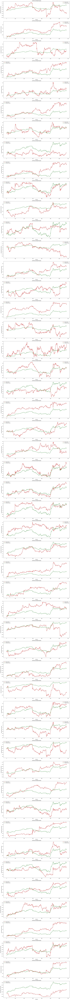

In [10]:
train_lstm_model(model_dataset)

Epoch 1/50
13/13 [==============================] - 4s 221ms/step - loss: 0.7064 - val_loss: 0.3945
Epoch 2/50
13/13 [==============================] - 3s 196ms/step - loss: 0.3544 - val_loss: 0.3562
Epoch 3/50
13/13 [==============================] - 3s 198ms/step - loss: 0.3127 - val_loss: 0.3284
Epoch 4/50
13/13 [==============================] - 3s 200ms/step - loss: 0.2957 - val_loss: 0.3077
Epoch 5/50
13/13 [==============================] - 3s 203ms/step - loss: 0.2658 - val_loss: 0.2495
Epoch 6/50
13/13 [==============================] - 3s 204ms/step - loss: 0.2306 - val_loss: 0.2531
Epoch 7/50
13/13 [==============================] - 3s 207ms/step - loss: 0.2246 - val_loss: 0.2439
Epoch 8/50
13/13 [==============================] - 3s 206ms/step - loss: 0.2201 - val_loss: 0.2547
Epoch 9/50
13/13 [==============================] - 3s 200ms/step - loss: 0.2176 - val_loss: 0.2444
Epoch 10/50
13/13 [==============================] - 3s 209ms/step - loss: 0.2103 - val_loss: 0.2391

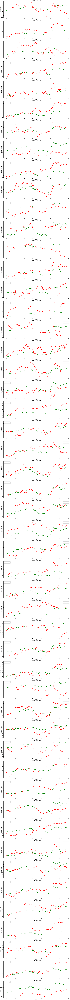

In [11]:
train_lstm_model_anirudh(model_dataset)